In [2]:
from datasets import load_dataset

dataset = load_dataset('weathon/aas_benchmark_final')

README.md: 0.00B [00:00, ?B/s]

data/train-00000-of-00015.parquet:   0%|          | 0.00/731M [00:00<?, ?B/s]

data/train-00001-of-00015.parquet:   0%|          | 0.00/685M [00:00<?, ?B/s]

data/train-00002-of-00015.parquet:   0%|          | 0.00/650M [00:00<?, ?B/s]

data/train-00003-of-00015.parquet:   0%|          | 0.00/615M [00:00<?, ?B/s]

data/train-00004-of-00015.parquet:   0%|          | 0.00/550M [00:00<?, ?B/s]

data/train-00005-of-00015.parquet:   0%|          | 0.00/606M [00:00<?, ?B/s]

data/train-00006-of-00015.parquet:   0%|          | 0.00/635M [00:00<?, ?B/s]

data/train-00007-of-00015.parquet:   0%|          | 0.00/608M [00:00<?, ?B/s]

data/train-00008-of-00015.parquet:   0%|          | 0.00/256M [00:00<?, ?B/s]

data/train-00009-of-00015.parquet:   0%|          | 0.00/164M [00:00<?, ?B/s]

data/train-00010-of-00015.parquet:   0%|          | 0.00/147M [00:00<?, ?B/s]

data/train-00011-of-00015.parquet:   0%|          | 0.00/168M [00:00<?, ?B/s]

data/train-00012-of-00015.parquet:   0%|          | 0.00/178M [00:00<?, ?B/s]

data/train-00013-of-00015.parquet:   0%|          | 0.00/396M [00:00<?, ?B/s]

data/train-00014-of-00015.parquet:   0%|          | 0.00/778M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/3300 [00:00<?, ? examples/s]

In [3]:
import numpy as np
np.unique(dataset["train"]["model"])

array(['dance_flux', 'flux_dev', 'flux_krea', 'grpo_flux', 'nano-banana',
       'playground', 'sd3_medium_grpo', 'sd3_medium_grpo_2',
       'sd3_medium_grpo_geneval', 'stable_diffusion_3.5_medium',
       'stable_diffusion_xl'], dtype='<U27')

In [4]:
dataset = dataset["train"]

In [5]:
blip_selected = dataset["blip_score"]

In [6]:
import torch
def blip_selected(sample):
    blip_score = sample["blip_score"]
    blip_score = torch.tensor(blip_score)
    # blip_score = blip_score.softmax(dim=-1)
    sample["blip_selected"] = blip_score[:,1].softmax(dim=0)
    return sample 

In [7]:
dataset = dataset.map(blip_selected)

Map:   0%|          | 0/3300 [00:00<?, ? examples/s]

In [8]:
llm_selected = np.array(dataset["llm_selected"])
blip_selected = np.array(dataset["blip_selected"])

In [9]:
selected = llm_selected != -1
llm_selected = llm_selected[selected]
blip_selected = blip_selected[selected]

In [10]:
import torch
def hpsv2_selected(sample):
    hpsv2 = torch.tensor([sample["hpsv2_reward"]["hpsv2_oidp"], sample["hpsv2_reward"]["hpsv2_didp"]])
    sample["hpsv2_selected"] = hpsv2.softmax(dim=-1)
    return sample

def hpsv3_selected(sample):
    try:
        hpsv3 = torch.tensor([sample["hpsv3_reward"]["hpsv3_oidp"][0], sample["hpsv3_reward"]["hpsv3_didp"][0]])
    except TypeError:
        hpsv3 = torch.tensor([sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_oidp"][0], sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_didp"][0]])

    sample["hpsv3_selected"] = hpsv3.softmax(dim=-1)
    return sample

def image_reward_selected(sample):
    image_reward = torch.tensor([sample["image_reward"]["image_reward_oidp"], sample["image_reward"]["image_reward_didp"]])
    sample["image_selected"] = image_reward.softmax(dim=-1)
    return sample

In [11]:
dataset = dataset.map(hpsv2_selected)
dataset = dataset.map(hpsv3_selected)
dataset = dataset.map(image_reward_selected)

Map:   0%|          | 0/3300 [00:00<?, ? examples/s]

Map:   0%|          | 0/3300 [00:00<?, ? examples/s]

Map:   0%|          | 0/3300 [00:00<?, ? examples/s]

In [12]:
hpsv2_selected = np.array(dataset["hpsv2_selected"])
hpsv3_selected = np.array(dataset["hpsv3_selected"])
image_reward_selected = np.array(dataset["image_selected"])
blip_selected = np.array(dataset["blip_selected"])

In [13]:
from sklearn.metrics import cohen_kappa_score, f1_score 
from sklearn.metrics import accuracy_score, balanced_accuracy_score, roc_auc_score
reward_model_res = []
for i in range(4):
    model_name = ["HPSv2.1", "HPSv3", "ImageReward", "BLIP"][i]
    selected_array = [hpsv2_selected, hpsv3_selected, image_reward_selected, blip_selected][i] 
    bas = balanced_accuracy_score(llm_selected, selected_array[selected].argmax(axis=1)) 
    acc = accuracy_score(llm_selected, selected_array[selected].argmax(axis=1))
    f1 = f1_score(llm_selected, selected_array[selected].argmax(axis=1), average='weighted')
    auc = roc_auc_score(llm_selected, selected_array[selected][:,1])
    reward_model_res.append({ 
        "Model": model_name,
        "Balanced Accuracy": bas,
        "Accuracy": acc, 
        "F1 score": f1,
        "AUROC": auc
    })
    

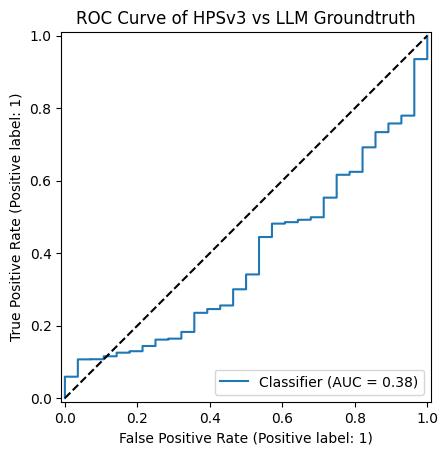

In [14]:
# draw the roc of hpsv3
import pylab
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay
RocCurveDisplay.from_predictions(llm_selected, hpsv3_selected[selected][:,1])
pylab.plot([0, 1], [0, 1], 'k--')
plt.title("ROC Curve of HPSv3 vs LLM Groundtruth")
plt.show()

In [15]:
import pandas as pd 
tab = pd.DataFrame(reward_model_res).style.format(precision=3)
print(tab.to_latex())

\begin{tabular}{llrrrr}
 & Model & Balanced Accuracy & Accuracy & F1 score & AUROC \\
0 & HPSv2.1 & 0.568 & 0.565 & 0.711 & 0.534 \\
1 & HPSv3 & 0.422 & 0.381 & 0.541 & 0.385 \\
2 & ImageReward & 0.650 & 0.762 & 0.854 & 0.709 \\
3 & BLIP & 0.682 & 0.965 & 0.972 & 0.888 \\
\end{tabular}



In [16]:
dataset_no_image = dataset.remove_columns(["image_distorted", "image_original"])

In [17]:
# rater_deltas = []
# for sample in dataset_no_image:
#     rater_deltas.append(sum(sample["rater"]["distorted"]["scores"]) - sum(sample["rater"]["original"]["scores"]))


In [18]:
hpsv2_global = np.array([np.array(sample["hpsv2_reward"]["hpsv2_oiop"]) for sample in dataset_no_image] + [np.array(sample["hpsv2_reward"]["hpsv2_diop"]) for sample in dataset_no_image])
image_reward_global = np.array([np.array(sample["image_reward"]["image_reward_oiop"]) for sample in dataset_no_image] + [np.array(sample["image_reward"]["image_reward_diop"]) for sample in dataset_no_image])
rater_global = np.array([np.array(sum(sample["rater"]["original"]["scores"])) for sample in dataset_no_image] + [np.array(sum(sample["rater"]["distorted"]["scores"])) for sample in dataset_no_image])

In [19]:
hpsv3_global = []
for sample in dataset_no_image:
    try:
        hpsv3_global.append(np.array(sample["hpsv3_reward"]["hpsv3_oiop"][0])) 
        hpsv3_global.append(np.array(sample["hpsv3_reward"]["hpsv3_diop"][0]))
    except TypeError:
        hpsv3_global.append(np.array(sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_oiop"][0]))
        hpsv3_global.append(np.array(sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_diop"][0]))
hpsv3_global = np.array(hpsv3_global)

In [20]:
# delta_hpsv2 = []

# for sample in dataset_no_image:
#     delta_hpsv2.append((sample["hpsv2_reward"]["hpsv2_diop"] - hpsv2_global.mean())/hpsv2_global.std() - (sample["hpsv2_reward"]["hpsv2_oiop"] - hpsv2_global.mean())/hpsv2_global.std())

# delta_hpsv2 = np.array(delta_hpsv2)

# delta_hpsv3 = [] 
# for sample in dataset_no_image:
#     try:
#         delta_hpsv3.append((sample["hpsv3_reward"]["hpsv3_diop"][0] - hpsv3_global.mean())/hpsv3_global.std() - (sample["hpsv3_reward"]["hpsv3_oiop"][0] - hpsv3_global.mean())/hpsv3_global.std())
#     except TypeError:
#         delta_hpsv3.append((sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_diop"][0] - hpsv3_global.mean())/hpsv3_global.std() - (sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_oiop"][0] - hpsv3_global.mean())/hpsv3_global.std())

# delta_hpsv3 = np.array(delta_hpsv3)

# delta_image_reward = []
# for sample in dataset_no_image:
#     delta_image_reward.append((sample["image_reward"]["image_reward_diop"] - image_reward_global.mean())/image_reward_global.std() - 
#                               (sample["image_reward"]["image_reward_oiop"] - image_reward_global.mean())/image_reward_global.std())
# delta_image_reward = np.array(delta_image_reward)

# rater_deltas = []
# for sample in dataset_no_image:
#     rater_deltas.append((sum(sample["rater"]["distorted"]["scores"]) - rater_global.mean())/rater_global.std() -
#                           (sum(sample["rater"]["original"]["scores"]) - rater_global.mean())/rater_global.std())
    
# rater_deltas = np.array(rater_deltas)

# rater_after = []
# for sample in dataset_no_image:
#     rater_after.append(np.sum(sample["rater"]["distorted"]["scores"]))
# rater_after = np.array(rater_after)
# dims = ['background', 'clarity', 'color aesthetic', 'color brightness', 'detail realism', 'detail refinement', 'emotion', 'lighting distinction', 'main object', 'object pairing', 'richness']
# import json
# delta_rater_selected = [] 
# for sample in dataset_no_image: 
#     selected_dims = json.loads(sample["selected_dims"])
#     selected_idx = [dims.index(dim) for dim in selected_dims]
#     original_scores = [sample["rater"]["original"]["scores"][i] for i in selected_idx]
#     distorted_scores = [sample["rater"]["distorted"]["scores"][i] for i in selected_idx]
#     dis = (np.sum(np.array(distorted_scores)) - rater_global.mean())/rater_global.std() - (np.sum(np.array(original_scores)) - rater_global.mean())/rater_global.std()
#     delta_rater_selected.append(dis) 
# delta_rater_selected = np.array(delta_rater_selected)
# llm_win = []
# for sample in dataset_no_image:
#     llm_win.append(int(sample["llm_selected"] == 1) * 1)
# llm_win = np.array(llm_win)

In [21]:
delta_hpsv2 = []
for sample in dataset_no_image:
    delta_hpsv2.append(sample["hpsv2_reward"]["hpsv2_diop"] - sample["hpsv2_reward"]["hpsv2_oiop"])
delta_hpsv2 = np.array(delta_hpsv2)

delta_hpsv3 = [] 
for sample in dataset_no_image:
    try:
        delta_hpsv3.append(sample["hpsv3_reward"]["hpsv3_diop"][0] - sample["hpsv3_reward"]["hpsv3_oiop"][0])
    except TypeError:
        delta_hpsv3.append(sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_diop"][0] - sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_oiop"][0])
delta_hpsv3 = np.array(delta_hpsv3)

delta_image_reward = []
for sample in dataset_no_image:
    delta_image_reward.append(sample["image_reward"]["image_reward_diop"] - sample["image_reward"]["image_reward_oiop"])
delta_image_reward = np.array(delta_image_reward)

rater_deltas = []
for sample in dataset_no_image:
    rater_deltas.append(sum(sample["rater"]["distorted"]["scores"]) - sum(sample["rater"]["original"]["scores"]))
rater_deltas = np.array(rater_deltas)

rater_after = []
for sample in dataset_no_image:
    rater_after.append(np.sum(sample["rater"]["distorted"]["scores"]))
rater_after = np.array(rater_after)

dims = ['background', 'clarity', 'color aesthetic', 'color brightness', 'detail realism', 'detail refinement', 'emotion', 'lighting distinction', 'main object', 'object pairing', 'richness']

import json
delta_rater_selected = [] 
for sample in dataset_no_image: 
    selected_dims = json.loads(sample["selected_dims"])
    selected_idx = [dims.index(dim) for dim in selected_dims]
    original_scores = [sample["rater"]["original"]["scores"][i] for i in selected_idx]
    distorted_scores = [sample["rater"]["distorted"]["scores"][i] for i in selected_idx]
    dis = np.sum(np.array(distorted_scores)) - np.sum(np.array(original_scores))
    delta_rater_selected.append(dis) 
delta_rater_selected = np.array(delta_rater_selected)

llm_win = []
for sample in dataset_no_image:
    llm_win.append(int(sample["llm_selected"] == 1))
llm_win = np.array(llm_win)


In [62]:


hpsv3_after = []
for sample in dataset_no_image:
    try:
        hpsv3_after.append(sample["hpsv3_reward"]["hpsv3_diop"][0])
    except TypeError:
        hpsv3_after.append(sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_diop"][0])
hpsv3_after = np.array(hpsv3_after)
# hpsv3_after = (hpsv3_after - hpsv3_after.mean())/hpsv3_after.std()


In [63]:
try:
    dataset_no_image = dataset_no_image.remove_columns(["delta_hpsv2", "hpsv3_after", "delta_hpsv3", "delta_image_reward", "delta_rater", "rater_after", "llm_win", "delta_rater_selected"])
except:
    pass
dataset_no_image = dataset_no_image.add_column("delta_hpsv2", delta_hpsv2)
dataset_no_image = dataset_no_image.add_column("delta_hpsv3", delta_hpsv3)
dataset_no_image = dataset_no_image.add_column("delta_image_reward", delta_image_reward)
dataset_no_image = dataset_no_image.add_column("delta_rater", rater_deltas)
dataset_no_image = dataset_no_image.add_column("rater_after", rater_after)
dataset_no_image = dataset_no_image.add_column("llm_win", llm_win)
dataset_no_image = dataset_no_image.add_column("delta_rater_selected", delta_rater_selected)
dataset_no_image = dataset_no_image.add_column("hpsv3_after", hpsv3_after)

In [64]:
df = pd.DataFrame(dataset_no_image)

In [65]:
name_mapping = {
    'flux_dev': "Flux Dev",
    'dance_flux': "Dance Flux", 
    'grpo_flux': "PrefFlux",
    'flux_krea': "Flux Krea",
    'stable_diffusion_xl': "SDXL",
    'playground': "Playground",
    'stable_diffusion_3.5_medium': "SD3.5M",
    'sd3_medium_grpo': "SD3.5M-PickScore",
    'sd3_medium_grpo_geneval': "SD3.5M-GenEval",
    'nano-banana': "Nano Banana", 
}
row_order = ["flux_dev", "dance_flux", "grpo_flux", "flux_krea", "stable_diffusion_xl", "playground", "stable_diffusion_3.5_medium", "sd3_medium_grpo_geneval", "sd3_medium_grpo", "nano-banana"]

In [66]:
metric_cols = ["delta_hpsv2", "delta_hpsv3", "delta_image_reward", "delta_rater", "rater_after", "llm_win", "hpsv3_after"]
# z_scored_df = df[metric_cols]
# z_scored_df['model'] = df['model']
# z_score_averages = z_scored_df.groupby("model")[metric_cols].mean()

In [67]:
df = df.groupby("model")[metric_cols].mean()


In [68]:

deltas = df.groupby("model")[["delta_hpsv2", "delta_hpsv3", "hpsv3_after", "delta_image_reward", "delta_rater", "rater_after", "llm_win"]].mean()
# df["rater_after"] = (df["rater_after"] - df["rater_after"].mean())/df["rater_after"].std()
deltas = deltas.reindex(row_order)
deltas.index = [name_mapping[name] for name in deltas.index]
deltas.round(3).to_csv("reward_model_deltas.csv")  
deltas.round(3)  

,delta_hpsv2,delta_hpsv3,hpsv3_after,delta_image_reward,delta_rater,rater_after,llm_win
Flux Dev,-0.035,-3.165,9.070,-0.319,-1.092,8.944,0.560
Dance Flux,-0.018,-1.105,12.782,-0.201,-0.672,10.473,0.363
PrefFlux,-0.032,-2.771,10.211,-0.278,-1.027,9.343,0.597
Flux Krea,-0.041,-4.372,7.705,-0.425,-1.296,8.774,0.783
SDXL,-0.034,-4.041,4.439,-0.482,-1.136,8.575,0.717
Playground,-0.044,-4.170,7.133,-0.719,-1.204,9.174,0.580
SD3.5M,-0.027,-5.175,6.537,-0.409,-1.307,8.334,0.707
SD3.5M-GenEval,-0.031,-4.926,6.552,-0.318,-1.257,8.113,0.723
SD3.5M-PickScore,-0.023,-2.781,10.680,-0.198,-1.120,9.114,0.687
Nano Banana,-0.073,-9.351,2.742,-0.855,-3.263,7.769,0.990


In [69]:
import pandas as pd
# tab = deltas.style.format(precision=3)  
print(deltas.to_latex(float_format="%.3f"))

\begin{tabular}{lrrrrrrr}
\toprule
 & delta_hpsv2 & delta_hpsv3 & hpsv3_after & delta_image_reward & delta_rater & rater_after & llm_win \\
\midrule
Flux Dev & -0.035 & -3.165 & 9.070 & -0.319 & -1.092 & 8.944 & 0.560 \\
Dance Flux & -0.018 & -1.105 & 12.782 & -0.201 & -0.672 & 10.473 & 0.363 \\
PrefFlux & -0.032 & -2.771 & 10.211 & -0.278 & -1.027 & 9.343 & 0.597 \\
Flux Krea & -0.041 & -4.372 & 7.705 & -0.425 & -1.296 & 8.774 & 0.783 \\
SDXL & -0.034 & -4.041 & 4.439 & -0.482 & -1.136 & 8.575 & 0.717 \\
Playground & -0.044 & -4.170 & 7.133 & -0.719 & -1.204 & 9.174 & 0.580 \\
SD3.5M & -0.027 & -5.175 & 6.537 & -0.409 & -1.307 & 8.334 & 0.707 \\
SD3.5M-GenEval & -0.031 & -4.926 & 6.552 & -0.318 & -1.257 & 8.113 & 0.723 \\
SD3.5M-PickScore & -0.023 & -2.781 & 10.680 & -0.198 & -1.120 & 9.114 & 0.687 \\
Nano Banana & -0.073 & -9.351 & 2.742 & -0.855 & -3.263 & 7.769 & 0.990 \\
\bottomrule
\end{tabular}



In [ ]:
import torch
from diffusers import StableDiffusionPipeline

model_id = "CompVis/stable-diffusion-v1-4"
device = "cuda:1"


pipe = StableDiffusionPipeline.from_pretrained(model_id, torch_dtype=torch.float16)
pipe = pipe.to(device)


In [ ]:
prompt = "a house in US"
image = pipe(prompt).images[0]  
    
image.save("astronaut_rides_horse.png")

  0%|          | 0/50 [00:00<?, ?it/s]

: 

In [30]:
# np.where((df["model"] == 'playground') & (df["llm_selected"] == 1))

In [31]:
dataset

Dataset({
    features: ['image_original', 'image_distorted', 'index', 'prompt_original', 'prompt_distorted', 'selected_dims', 'llm_judge', 'hpsv2_reward', 'llm_selected', 'blip_selected', 'model', 'blip_score', 'image_reward', 'hpsv3_reward', 'rater', 'blip_score_original', 'hpsv2_selected', 'hpsv3_selected', 'image_selected'],
    num_rows: 3300
})

In [32]:
# print(rater_deltas[1596]) 
# print(dataset[1596]["selected_dims"])
# dataset[1596]["image_distorted"] 

In [33]:
# selected = np.where([int("emotion" in json.loads(i)) for i in list(df["selected_dims"])])[0]

In [34]:
from pprint import pprint 
releative_index = 126 #selected[10] 19
absolute_index = np.where(df["index"] == releative_index)[0]
images = dataset[absolute_index]["image_distorted"]
print(dataset["prompt_distorted"][absolute_index[0]])

KeyError: 'index'

-1
SD3.5M-PickScore


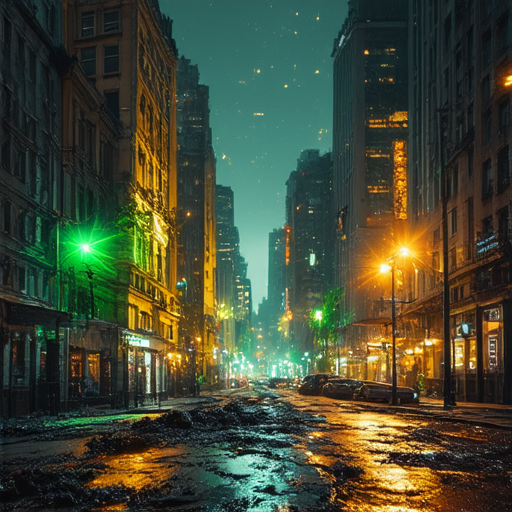

In [ ]:
i = 6
print(dataset[absolute_index[i]]["llm_selected"])
print(name_mapping[dataset[absolute_index]["model"][i]])
images[i] 


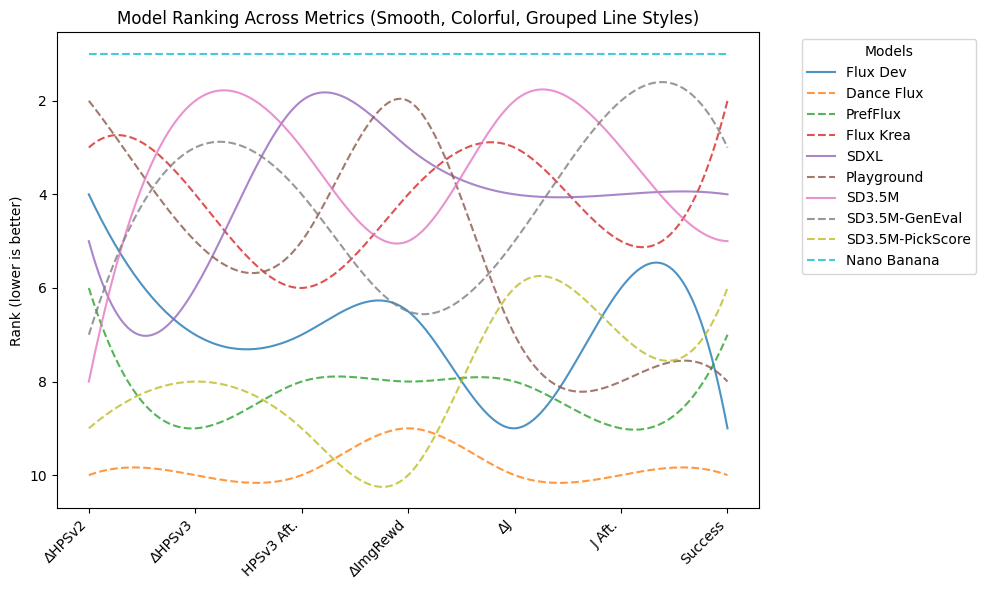

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import make_interp_spline

data = {
    "Model": ["Flux Dev", "Dance Flux", "PrefFlux", "Flux Krea", "SDXL", "Playground", "SD3.5M", "SD3.5M-GenEval", "SD3.5M-PickScore", "Nano Banana"],
    "∆HPSv2": [-0.752, -0.394, -0.683, -0.882, -0.731, -0.949, -0.588, -0.673, -0.498, -1.571],
    "∆HPSv3": [-0.665, -0.232, -0.582, -0.918, -0.849, -0.876, -1.087, -1.035, -0.584, -1.964],
    "HPSv3 Aft.": [0.192, 0.891, 0.407, -0.065, -0.680, -0.172, -0.285, -0.282, 0.496, -0.999],
    "∆ImgRewd": [-0.377, -0.238, -0.329, -0.503, -0.570, -0.851, -0.484, -0.377, -0.234, -1.012],
    "∆J": [-0.200, -0.114, -0.208, -0.261, -0.256, -0.224, -0.274, -0.248, -0.236, -0.663],
    "J Aft.": [8.944, 10.473, 9.343, 8.774, 8.575, 9.174, 8.334, 8.113, 9.114, 7.769],
    "Success": [0.560, 0.363, 0.597, 0.783, 0.717, 0.580, 0.707, 0.723, 0.687, 0.990]
}

df = pd.DataFrame(data)
metrics = ["∆HPSv2", "∆HPSv3", "HPSv3 Aft.", "∆ImgRewd", "∆J", "J Aft.", "Success"]

ranks = df[metrics].rank(method="average", ascending=True)
ranks["Success"] = df["Success"].rank(method="average", ascending=False)
ranks["Model"] = df["Model"]

plt.figure(figsize=(10,6))
x = np.arange(len(metrics))

group1 = ["Dance Flux", "PrefFlux", "Flux Krea", "Playground", "SD3.5M-GenEval", "SD3.5M-PickScore", "Nano Banana"]
group2 = [m for m in df["Model"] if m not in group1]

colors = plt.cm.tab10(np.linspace(0, 1, len(df)))
linestyles = {"group1": "dashed", "group2": "solid"}

for i, row in ranks.iterrows():
    x_new = np.linspace(x.min(), x.max(), 200)
    y_smooth = make_interp_spline(x, row[metrics])(x_new)
    if row["Model"] in group1:
        plt.plot(x_new, y_smooth, linestyle=linestyles["group1"], color=colors[i], label=row["Model"], alpha=0.8)
    else:
        plt.plot(x_new, y_smooth, linestyle=linestyles["group2"], color=colors[i], label=row["Model"], alpha=0.8)

plt.xticks(x, metrics, rotation=45, ha="right")
plt.gca().invert_yaxis()
plt.ylabel("Rank (lower is better)")
plt.title("Model Ranking Across Metrics (Smooth, Colorful, Grouped Line Styles)")
plt.legend(bbox_to_anchor=(1.05, 1), loc="upper left", title="Models")
plt.tight_layout()
plt.show()


In [ ]:
raw_hpsv3 = []
raw_hpsv2 = []
raw_image_reward = []
for sample in dataset_no_image:
    try:
        raw_hpsv3.append(sample["hpsv3_reward"]["hpsv3_oiop"][0]) 
    except TypeError:
        raw_hpsv3.append(sample["hpsv3_reward"]["hpsv3_reward"]["hpsv3_oiop"][0])
    raw_hpsv2.append(sample["hpsv2_reward"]["hpsv2_oiop"])
    raw_image_reward.append(sample["image_reward"]["image_reward_oiop"])

In [ ]:
import numpy as np
raw_hpsv3 = np.array(raw_hpsv3)
raw_hpsv2 = np.array(raw_hpsv2)
raw_image_reward = np.array(raw_image_reward)

In [ ]:
# print(f"{raw_hpsv3.mean():3f} $\pm$ {raw_hpsv3.std(ddof=1``):.3f} & {raw_hpsv2.mean():.3f} $\pm$ {raw_hpsv2.std(ddof=1``):.3f} & {raw_image_reward.mean():.3f} $\pm$ {raw_image_reward.std(ddof=1``):.3f}" )

In [ ]:
import numpy as np
import scipy.stats as st

def ci_95(x):
    x = np.array(x)
    mean = np.mean(x)
    se = st.sem(x)
    ci = st.t.interval(0.95, len(x)-1, loc=mean, scale=se)
    return mean, ci

vals = []
for arr in [raw_hpsv3, raw_hpsv2, raw_image_reward]:
    mean, ci = ci_95(arr)
    vals.append(f"{mean:.3f} $\\pm$ {ci[1]-mean:.3f}")

print(" & ".join(vals))


12.106 $\pm$ 0.102 & 0.303 $\pm$ 0.001 & 1.112 $\pm$ 0.023


In [ ]:
from datasets import load_dataset

ds = load_dataset("weathon/real_images")

README.md:   0%|          | 0.00/424 [00:00<?, ?B/s]

data/train-00000-of-00001.parquet:   0%|          | 0.00/6.18M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/18 [00:00<?, ? examples/s]

In [ ]:
from scipy.stats import mannwhitneyu

In [ ]:
from transformers import BlipProcessor, BlipForImageTextRetrieval

processor = BlipProcessor.from_pretrained("Salesforce/blip-itm-large-coco")
model = BlipForImageTextRetrieval.from_pretrained("Salesforce/blip-itm-large-coco", torch_dtype=torch.float16).to("cuda")


preprocessor_config.json:   0%|          | 0.00/445 [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/456 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

tokenizer.json: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/125 [00:00<?, ?B/s]

config.json: 0.00B [00:00, ?B/s]

pytorch_model.bin:   0%|          | 0.00/1.78G [00:00<?, ?B/s]

In [ ]:
blips_scores = []
for sample in ds["train"]:
    inputs = processor(sample["image"], sample["caption"], return_tensors="pt").to("cuda", torch.float16)

    itm_scores = model(**inputs)[0][0].softmax(dim=-1)[1]
    print(itm_scores)

tensor(0.9995, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(0.9995, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(0.9995, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(0.9990, device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward0>)
tensor(1., device='cuda:0', dtype=torch.float16, grad_fn=<SelectBackward

In [ ]:
res = []

In [ ]:
U, p = mannwhitneyu(raw_hpsv3, ds["train"]["hpsv3"], alternative='greater')
d = (2 * U) / (len(raw_hpsv3) * len(ds["train"]["hpsv3"])) - 1
res.append({"Reward Model": "HPSv3", "U": U, "p-value": p, "d": d})

In [ ]:
U, p = mannwhitneyu(raw_hpsv2, ds["train"]["hpsv2"], alternative='greater')
d = (2 * U) / (len(raw_hpsv2) * len(ds["train"]["hpsv2"])) - 1
res.append({"Reward Model": "HPSv2", "U": U, "p-value": p, "d": d})

In [ ]:
U, p = mannwhitneyu(raw_image_reward, ds["train"]["image_reward"], alternative='greater')
d = (2 * U) / (len(raw_image_reward) * len(ds["train"]["image_reward"])) - 1
res.append({"Reward Model": "Image Reward", "U": U, "p-value": p, "d": d})

In [ ]:
pd.DataFrame(res)
import pandas as pd 
tab = pd.DataFrame(res).style.format(precision=3)
print(tab.to_latex())

\begin{tabular}{llrrr}
 & Reward Model & U & p-value & d \\
0 & HPSv3 & 53900.000 & 0.000 & 0.815 \\
1 & HPSv2 & 58425.000 & 0.000 & 0.967 \\
2 & Image Reward & 52744.000 & 0.000 & 0.776 \\
\end{tabular}



In [ ]:
pd.DataFrame(res)

,Reward Model,U,p-value,d
0,HPSv3,53900.0,1.183687e-09,0.814815
1,HPSv2,58425.0,6.864338e-13,0.967172
2,Image Reward,52744.0,6.534614e-09,0.775892


In [ ]:
len(ds["train"]["image_reward"])

18

(array([0.0716842 , 0.        , 0.        , 0.        , 0.        ,
        0.        , 0.0716842 , 0.0716842 , 0.21505261, 0.0716842 ,
        0.        , 0.0716842 , 0.14336841, 0.0716842 , 0.21505261,
        0.        , 0.21505261, 0.        , 0.        , 0.0716842 ]),
 array([-3.01841164, -2.24340749, -1.46840334, -0.69339919,  0.08160496,
         0.85660911,  1.63161325,  2.4066174 ,  3.18162155,  3.9566257 ,
         4.73162985,  5.506634  ,  6.28163815,  7.05664229,  7.83164644,
         8.60665059,  9.38165474, 10.15665889, 10.93166304, 11.70666718,
        12.48167133]),
 <BarContainer object of 20 artists>)

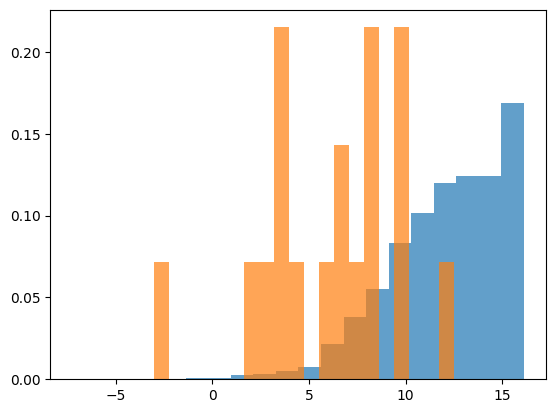

In [ ]:
pylab.hist(raw_hpsv3, bins=20, density=True, label=["AAS HPSv3", "Real Images HPSv3"], alpha=0.7)
pylab.hist(ds["train"]["hpsv3"], bins=20, density=True, alpha=0.7)

In [ ]:
import sys
from diffusers import FluxTransformer2DModel
from pathlib import Path
transformer_path = Path("../flux/flux/transformer/diffusion_pytorch_model.safetensors")
config_path = Path("../flux/flux/transformer/config.json")
model = FluxTransformer2DModel.from_single_file(
    str(transformer_path),
    config=str(config_path),
    torch_dtype=torch.bfloat16,
)

In [ ]:
from diffusers import FluxImg2ImgPipeline
pipe = FluxImg2ImgPipeline.from_pretrained(
    "black-forest-labs/FLUX.1-dev",
    torch_dtype=torch.bfloat16,
    transformer=model, 
)

In [ ]:
pipe = pipe.to("cuda")

In [ ]:
ds["train"]["caption"][-1]

'Zeus/Jupiter enthroned, crowned and draped in crimson, raising a scepter and clutching lightning bolts; an ancient Roman Pompeian wall fresco in the classical mythological genre.'

In [ ]:
idx = 120
images = pipe(
    image=dataset["image_distorted"][idx],
    prompt=dataset["prompt_distorted"][idx],
    strength=0.5
)

  0%|          | 0/14 [00:00<?, ?it/s]

In [ ]:
dataset["selected_dims"][idx] 

'["clarity", "detail refinement"]'

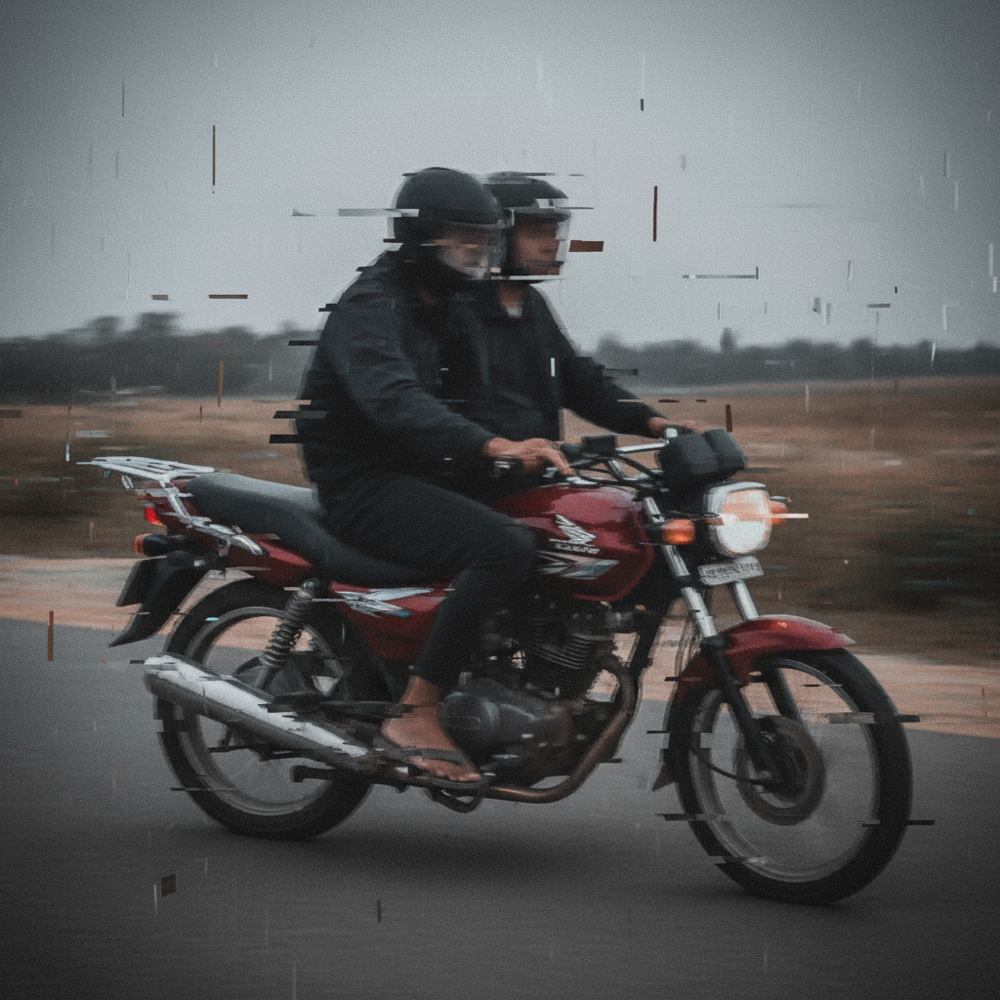

In [ ]:
dataset["image_distorted"][idx]

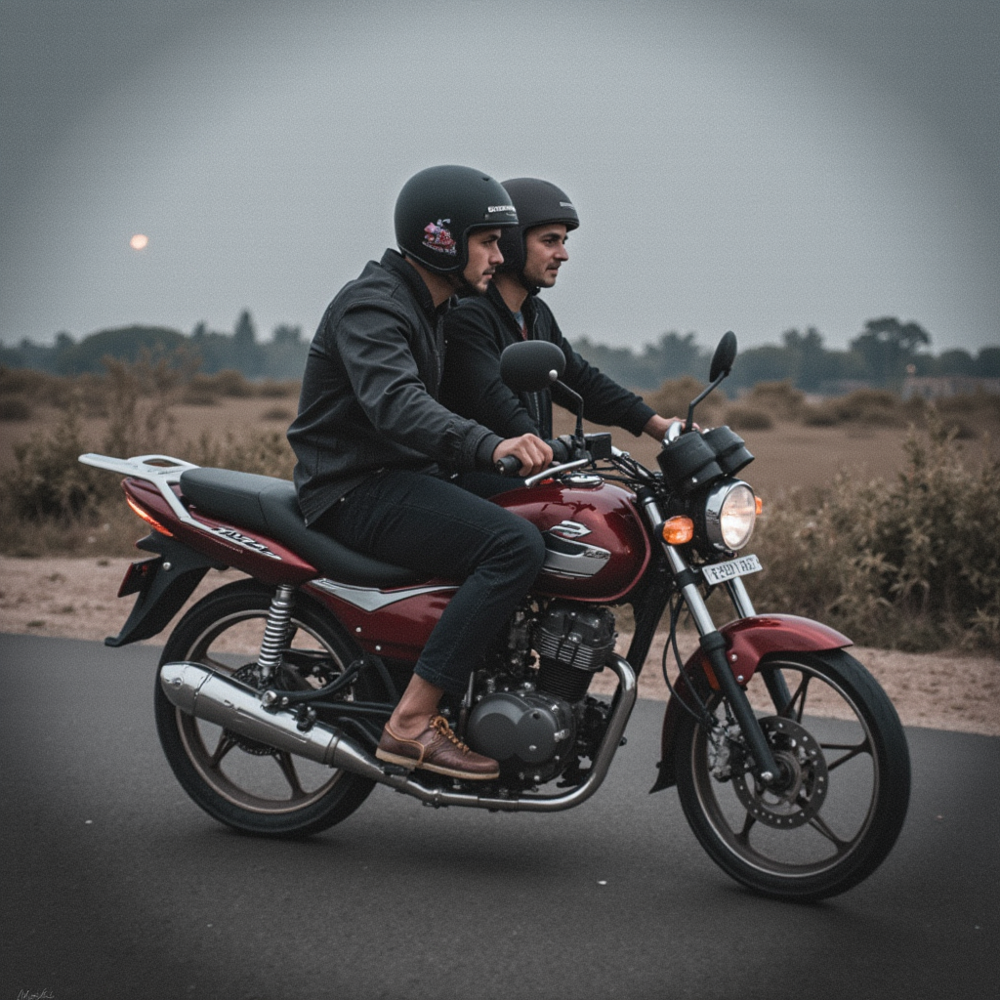

In [ ]:
images.images[0]  

In [ ]:
from datasets import load_dataset
dataset = load_dataset('weathon/aas_benchmark_final')

In [ ]:
from diffusers import AutoPipelineForImage2Image
import torch
playground = AutoPipelineForImage2Image.from_pretrained(
    "playgroundai/playground-v2.5-1024px-aesthetic",
    torch_dtype=torch.float16,
    variant="fp16",
)

sdxl = AutoPipelineForImage2Image.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=torch.float16,
    variant="fp16",
)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

`torch_dtype` is deprecated! Use `dtype` instead!


Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

In [ ]:
dataset = dataset["train"]

In [ ]:
playground = playground.to("cuda")
sdxl = sdxl.to("cuda")

In [ ]:
import numpy as np
from PIL import Image
def hstack(images):
    if len(images) == 0:
        raise ValueError("Need 0 or more images")

    if isinstance(images[0], np.ndarray):
        images = [Image.fromarray(img) for img in images]
    width = sum([img.size[0] for img in images])
    height = max([img.size[1] for img in images])
    stacked = Image.new(images[0].mode, (width, height))

    x_pos = 0
    for img in images:
        stacked.paste(img, (x_pos, 0))
        x_pos += img.size[0]
    return stacked

In [ ]:
idx = 3
sdxl_images = sdxl(
    image=dataset["image_distorted"][idx],
    prompt=dataset["prompt_distorted"][idx],
    strength=0.5
)

playground_images = playground(
    image=dataset["image_distorted"][idx],
    prompt=dataset["prompt_distorted"][idx],
    strength=0.5
)

  0%|          | 0/25 [00:00<?, ?it/s]

  0%|          | 0/25 [00:00<?, ?it/s]

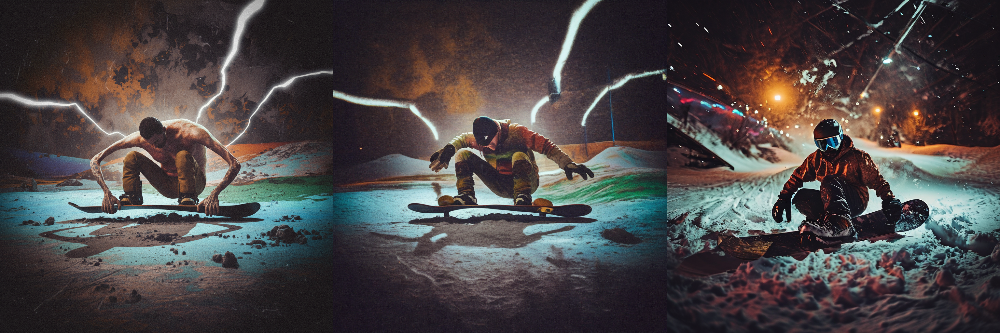

In [ ]:
hstack((dataset["image_distorted"][idx], sdxl_images.images[0], playground_images.images[0])) 

In [ ]:
from datasets import load_dataset
img2img_ds = load_dataset('weathon/aas_img2img_comparisons')["train"]
full_ds = load_dataset('weathon/aas_benchmark_final')["train"]

README.md:   0%|          | 0.00/772 [00:00<?, ?B/s]

data/train-00000-of-00005.parquet:   0%|          | 0.00/475M [00:00<?, ?B/s]

data/train-00001-of-00005.parquet:   0%|          | 0.00/491M [00:00<?, ?B/s]

data/train-00002-of-00005.parquet:   0%|          | 0.00/476M [00:00<?, ?B/s]

data/train-00003-of-00005.parquet:   0%|          | 0.00/489M [00:00<?, ?B/s]

data/train-00004-of-00005.parquet:   0%|          | 0.00/457M [00:00<?, ?B/s]

Generating train split:   0%|          | 0/284 [00:00<?, ? examples/s]

In [ ]:
import pandas as pd 
full_no_image = pd.DataFrame(full_ds.remove_columns(["image_distorted", "image_original"]))

In [ ]:
full_no_image["model"].unique() 

array(['nano-banana', 'stable_diffusion_xl', 'flux_krea', 'flux_dev',
       'grpo_flux', 'playground', 'sd3_medium_grpo',
       'sd3_medium_grpo_geneval', 'stable_diffusion_3.5_medium',
       'sd3_medium_grpo_2', 'dance_flux'], dtype=object)

In [ ]:
import numpy as np
np.where((full_no_image["model"] == "dance_flux") & (full_no_image["index"] == 1))

(array([3001]),)

In [ ]:
def add_img(sample):
    dance_index = np.where((full_no_image["model"] == "dance_flux") & (full_no_image["index"] == sample["index"]))
    krea_index = np.where((full_no_image["model"] == "flux_krea") & (full_no_image["index"] == sample["index"]))
    sample["dance_text_only"] = full_ds[dance_index]["image_distorted"]
    sample["krea_text_only"] = full_ds[krea_index]["image_distorted"]
    sample["original_prompt"] = full_ds[krea_index]["prompt_original"]
    return sample

img2img_ds = img2img_ds.map(add_img, num_proc=4)

Map (num_proc=4):   0%|          | 0/284 [00:00<?, ? examples/s]

In [ ]:
img2img_ds.push_to_hub("weathon/aas_img2img_comparisons")

Uploading the dataset shards:   0%|          | 0/5 [00:00<?, ? shards/s]

Map:   0%|          | 0/57 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/6 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

Map:   0%|          | 0/57 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/6 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

Map:   0%|          | 0/57 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/6 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

Map:   0%|          | 0/57 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/6 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

Map:   0%|          | 0/56 [00:00<?, ? examples/s]

Creating parquet from Arrow format:   0%|          | 0/6 [00:00<?, ?ba/s]

Processing Files (0 / 0): |          |  0.00B /  0.00B            

New Data Upload: |          |  0.00B /  0.00B            

CommitInfo(commit_url='https://huggingface.co/datasets/weathon/aas_img2img_comparisons/commit/c06c92e48c48241a7b8a65d4d64eaf7fc3a32002', commit_message='Upload dataset', commit_description='', oid='c06c92e48c48241a7b8a65d4d64eaf7fc3a32002', pr_url=None, repo_url=RepoUrl('https://huggingface.co/datasets/weathon/aas_img2img_comparisons', endpoint='https://huggingface.co', repo_type='dataset', repo_id='weathon/aas_img2img_comparisons'), pr_revision=None, pr_num=None)